# Time series - Netflix

Objetivo do modelo e fazer previsão futuras da privisão dados

Vou trabalhar inicialmente apenas com os dados ações netflix e posso, no futuro, generalizar o código e usá-lo para outros cryptos se funcionar para Bitcoin.

- **Modelo 01 ARIMA**

- **Modelo 02 SARIMA**

In [1]:
from platform import python_version

print('Versão python neste Jupyter Notebook:', python_version())

Versão python neste Jupyter Notebook: 3.8.8


In [43]:
# Importação das bibliotecas 

# Pandas carregamento csv
import pandas as pd 

# Numpy para carregamento cálculos em arrays multidimensionais
import numpy as np 

# Time series
import statsmodels.api as sm
from scipy import stats
from pandas import DataFrame
from datetime import datetime, timedelta
from itertools import product


# Visualização de dados
import seaborn as sns
import matplotlib as m
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

# Carregar as versões das bibliotecas
import watermark

# Warnings retirar alertas 
import warnings
warnings.filterwarnings("ignore")

In [44]:
# Configuração para os gráficos largura e layout dos graficos

plt.rcParams["figure.figsize"] = (25, 20)

plt.style.use('fivethirtyeight')
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

m.rcParams['axes.labelsize'] = 25
m.rcParams['xtick.labelsize'] = 25
m.rcParams['ytick.labelsize'] = 25
m.rcParams['text.color'] = 'k'

In [45]:
# Versões das bibliotecas

%reload_ext watermark
%watermark -a "Versões das bibliotecas" --iversions

Author: Versões das bibliotecas

pandas     : 1.2.4
seaborn    : 0.11.1
numpy      : 1.21.5
plotly     : 5.6.0
scipy      : 1.6.2
statsmodels: 0.12.2
matplotlib : 3.3.4
watermark  : 2.3.0



# Base dados

In [5]:
df = pd.read_csv("netflix.csv")
df

,Date,High,Low,Open,Close,Volume,Adj Close
0,2002-05-23,1.242857,1.145714,1.156429,1.196429,104790000.0,1.196429
1,2002-05-24,1.225000,1.197143,1.214286,1.210000,11104800.0,1.210000
2,2002-05-28,1.232143,1.157143,1.213571,1.157143,6609400.0,1.157143
3,2002-05-29,1.164286,1.085714,1.164286,1.103571,6757800.0,1.103571
4,2002-05-30,1.107857,1.071429,1.107857,1.071429,10154200.0,1.071429
...,...,...,...,...,...,...,...
4876,2021-10-05,640.390015,606.890015,606.940002,634.809998,9534300.0,634.809998
4877,2021-10-06,639.869995,626.359985,628.179993,639.099976,4580400.0,639.099976
4878,2021-10-07,646.840027,630.450012,642.229980,631.849976,3556900.0,631.849976
4879,2021-10-08,643.799988,630.859985,634.169983,632.659973,3271100.0,632.659973


In [6]:
# Exibido 5 primeiros dados
df.head()

,Date,High,Low,Open,Close,Volume,Adj Close
0,2002-05-23,1.242857,1.145714,1.156429,1.196429,104790000.0,1.196429
1,2002-05-24,1.225000,1.197143,1.214286,1.210000,11104800.0,1.210000
2,2002-05-28,1.232143,1.157143,1.213571,1.157143,6609400.0,1.157143
3,2002-05-29,1.164286,1.085714,1.164286,1.103571,6757800.0,1.103571
4,2002-05-30,1.107857,1.071429,1.107857,1.071429,10154200.0,1.071429


In [7]:
# Exibido 5 últimos dados 
df.tail()

,Date,High,Low,Open,Close,Volume,Adj Close
4876,2021-10-05,640.390015,606.890015,606.940002,634.809998,9534300.0,634.809998
4877,2021-10-06,639.869995,626.359985,628.179993,639.099976,4580400.0,639.099976
4878,2021-10-07,646.840027,630.450012,642.229980,631.849976,3556900.0,631.849976
4879,2021-10-08,643.799988,630.859985,634.169983,632.659973,3271100.0,632.659973
4880,2021-10-11,639.419983,626.780029,633.200012,627.039978,2861200.0,627.039978


In [8]:
# Número de linhas e colunas
df.shape

(4881, 7)

In [9]:
# Verificando informações das variaveis
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4881 entries, 0 to 4880
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       4881 non-null   object 
 1   High       4881 non-null   float64
 2   Low        4881 non-null   float64
 3   Open       4881 non-null   float64
 4   Close      4881 non-null   float64
 5   Volume     4881 non-null   float64
 6   Adj Close  4881 non-null   float64
dtypes: float64(6), object(1)
memory usage: 267.1+ KB


In [10]:
# Exibido tipos de dados
df.dtypes

Date          object
High         float64
Low          float64
Open         float64
Close        float64
Volume       float64
Adj Close    float64
dtype: object

In [11]:
# Total de colunas e linhas 

print("Números de linhas: {}" .format(df.shape[0]))
print("Números de colunas: {}" .format(df.shape[1]))

Números de linhas: 4881
Números de colunas: 7


In [12]:
# Exibindo valores ausentes e valores únicos

print("\nMissing values :  ", df.isnull().sum().values.sum())
print("\nUnique values :  \n",df.nunique())


Missing values :   0

Unique values :  
 Date         4881
High         4329
Low          4317
Open         4352
Close        4415
Volume       4741
Adj Close    4415
dtype: int64


In [13]:
# Sum() Retorna a soma dos valores sobre o eixo solicitado
# Isna() Detecta valores ausentes

df.isna().sum()

Date         0
High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [14]:
# Retorna a soma dos valores sobre o eixo solicitado
# Detecta valores não ausentes para um objeto semelhante a uma matriz.

df.notnull().sum()

Date         4881
High         4881
Low          4881
Open         4881
Close        4881
Volume       4881
Adj Close    4881
dtype: int64

In [15]:
# Total de número duplicados

df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
4876    False
4877    False
4878    False
4879    False
4880    False
Length: 4881, dtype: bool

# Estatística descritiva

In [16]:
# Exibindo estatísticas descritivas visualizar alguns detalhes estatísticos básicos como percentil, média, padrão, etc. 
# De um quadro de dados ou uma série de valores numéricos.

df.describe().T

,count,mean,std,min,25%,50%,75%,max
High,4881.0,1.070034e+02,1.593264e+02,0.410714,3.977143e+00,2.226143e+01,1.274300e+02,6.468400e+02
Low,4881.0,1.037427e+02,1.546623e+02,0.346429,3.838571e+00,2.115000e+01,1.235900e+02,6.308600e+02
Open,4881.0,1.053885e+02,1.570071e+02,0.377857,3.901429e+00,2.152429e+01,1.259500e+02,6.422300e+02
Close,4881.0,1.054341e+02,1.570732e+02,0.372857,3.906429e+00,2.163286e+01,1.253900e+02,6.391000e+02
Volume,4881.0,1.679949e+07,1.936794e+07,285600.000000,6.286300e+06,1.082310e+07,2.015640e+07,3.234140e+08
Adj Close,4881.0,1.054341e+02,1.570732e+02,0.372857,3.906429e+00,2.163286e+01,1.253900e+02,6.391000e+02


In [17]:
# Matriz correlação de pares de colunas, excluindo NA / valores nulos.
df.corr()

,High,Low,Open,Close,Volume,Adj Close
High,1.000000,0.999820,0.999864,0.999869,-0.248897,0.999869
Low,0.999820,1.000000,0.999859,0.999862,-0.251533,0.999862
Open,0.999864,0.999859,1.000000,0.999707,-0.250253,0.999707
Close,0.999869,0.999862,0.999707,1.000000,-0.250103,1.000000
Volume,-0.248897,-0.251533,-0.250253,-0.250103,1.000000,-0.250103
Adj Close,0.999869,0.999862,0.999707,1.000000,-0.250103,1.000000


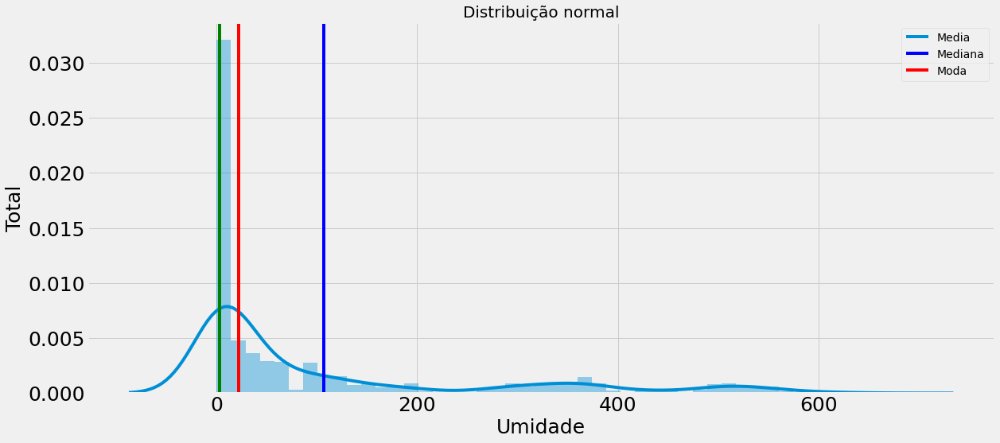

In [18]:
# Gráfico distribuição normal
plt.figure(figsize=(18.2, 8))

ax = sns.distplot(df['High']);
plt.title("Distribuição normal", fontsize=20)
plt.xlabel("Umidade")
plt.ylabel("Total")
plt.axvline(df['High'].mean(), color='b')
plt.axvline(df['High'].median(), color='r')
plt.axvline(df['High'].mode()[0], color='g');
plt.legend(["Media", "Mediana", "Moda"])
plt.show()

Text(0.5, 1.0, 'Matriz de correlação')

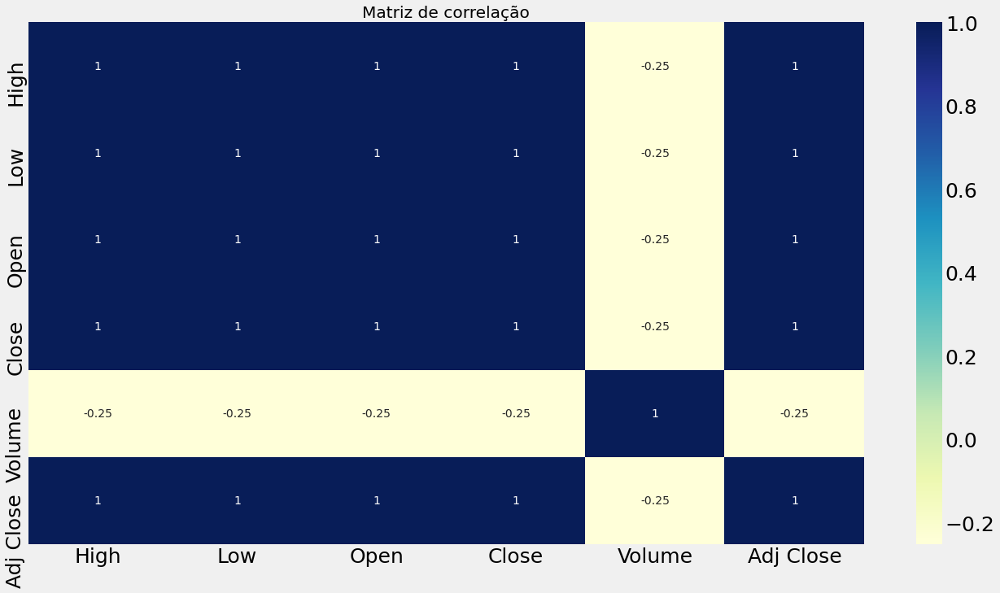

In [19]:
# Gráfico da matriz de correlação

plt.figure(figsize=(20.5,11))
ax = sns.heatmap(df.corr(), annot=True, cmap='YlGnBu');
plt.title("Matriz de correlação")

In [20]:
# Matriz de correlação interativa

fig = px.imshow(df.iloc[:, 1:].corr())
fig.show()

<AxesSubplot:title={'center':'Total bitcoin valor fechado'}, xlabel='Close'>

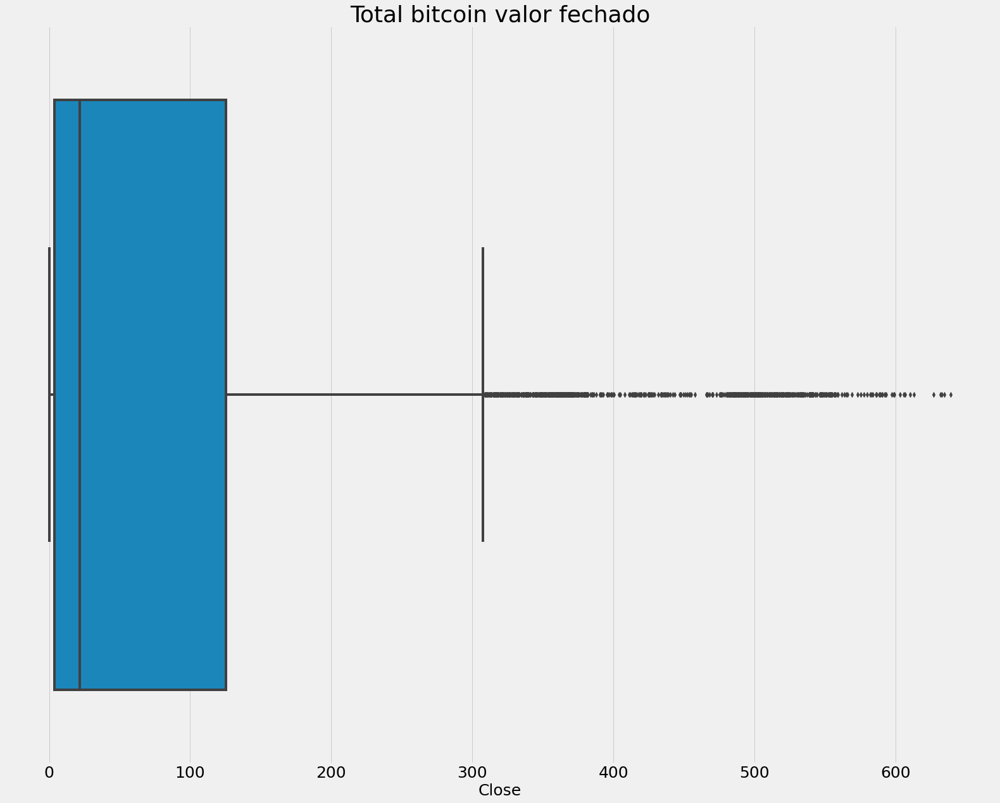

In [36]:
plt.title("Total bitcoin valor fechado")
plt.xlabel("Valor")
sns.boxplot(df["Close"])

# Análise dados

In [21]:
# Cálculo da média movel

media_alta = df[['Date', 'High']].groupby('Date').mean()
media_baixa = df[["Date", "Low"]].groupby('Date').mean()

print("Média das ações alta", media_alta)
print()
print("Média das ações baixa", media_baixa)

Média de média alta                   High
Date                  
2002-05-23    1.242857
2002-05-24    1.225000
2002-05-28    1.232143
2002-05-29    1.164286
2002-05-30    1.107857
...                ...
2021-10-05  640.390015
2021-10-06  639.869995
2021-10-07  646.840027
2021-10-08  643.799988
2021-10-11  639.419983

[4881 rows x 1 columns]

Média de média media baixa                    Low
Date                  
2002-05-23    1.145714
2002-05-24    1.197143
2002-05-28    1.157143
2002-05-29    1.085714
2002-05-30    1.071429
...                ...
2021-10-05  606.890015
2021-10-06  626.359985
2021-10-07  630.450012
2021-10-08  630.859985
2021-10-11  626.780029

[4881 rows x 1 columns]


In [23]:
# Gráfico ações em alta

fig = px.line(df, x="Date", y="High", title="Ações em alta")
fig.show()

In [24]:
# Gráfico da ações em baixo

fig = px.line(df, x="Date", y="Low", title="Ações em baixo")
fig.show()

In [25]:
# Gráfico da ações em fechado

fig = px.line(df, x="Date", y="Close", title="Ações em fechado")
fig.show()

In [26]:
fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'])])

fig.show()

In [27]:
fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                open=df['Open'], high=df['High'],
                low=df['Low'], close=df['Close'])
                     ])

fig.update_layout(
    title='Açãoes da Starlink',
    yaxis_title='Total',
    xaxis_title='Starlink Stock',
    xaxis_rangeslider_visible=False)
fig.show()

In [28]:
fig = go.Figure(data=[go.Candlestick(
    x=df['Date'],
    open=df['Open'], high=df['High'],
    low=df['Low'], close=df['Close'],
    increasing_line_color= 'cyan', decreasing_line_color= 'gray'
)])

fig.update_layout(
    title='Açãoes da Starlink',
    yaxis_title='Total',
    xaxis_title='Starlink Stock',
    xaxis_rangeslider_visible=False)
fig.show()

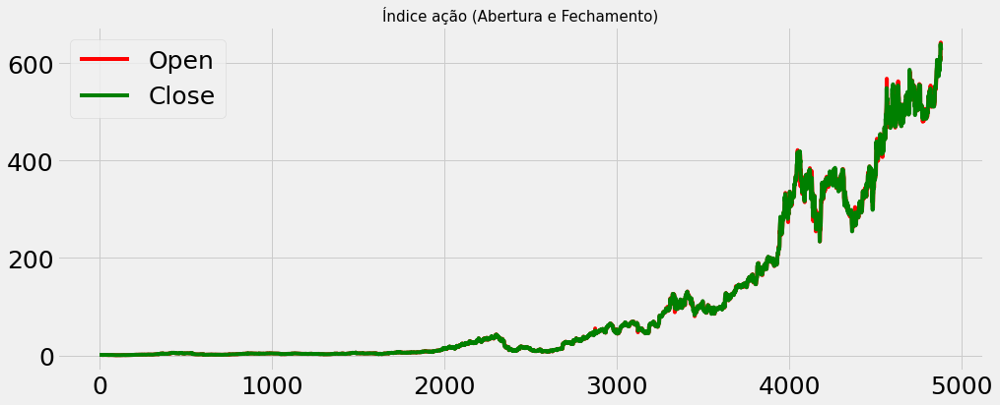

In [29]:
plt.figure(figsize=(15,6))
df['Open'].plot(color='r')
df['Close'].plot(color='g')
plt.xlabel('')
plt.title('Índice ação (Abertura e Fechamento)',size=15)
plt.legend()
plt.show()

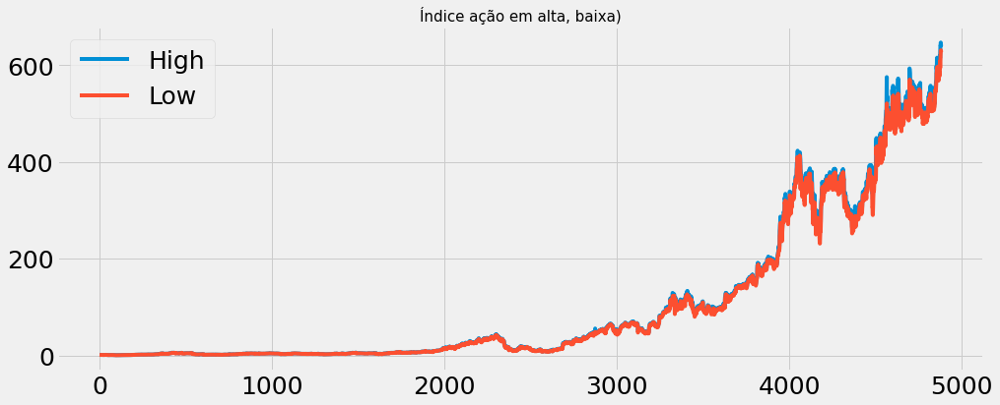

In [30]:
plt.figure(figsize=(15,6))
df['High'].plot()
df['Low'].plot()
plt.xlabel('')
plt.title('Índice ação em alta, baixa)',size=15)
plt.legend()
plt.show()

# Análise de dados = Univariada

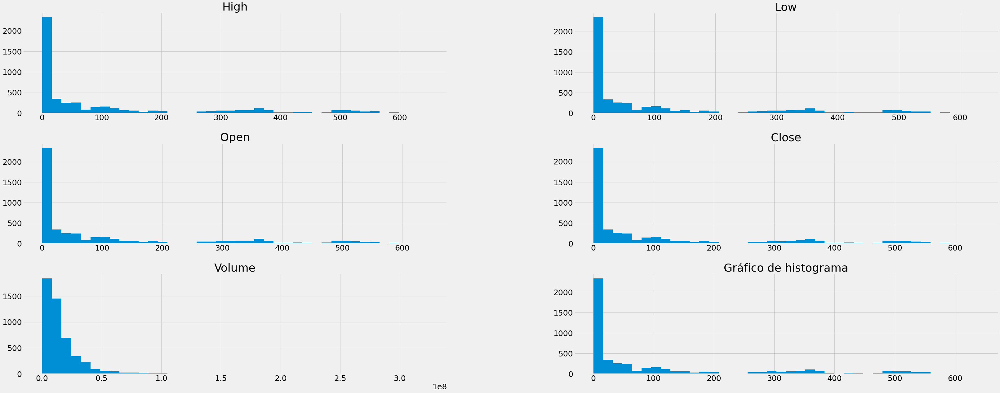

In [31]:
# Fazendo um comparativo dos dados 

df.hist(bins = 40, figsize=(50.2, 20))
plt.title("Gráfico de histograma")
plt.show()

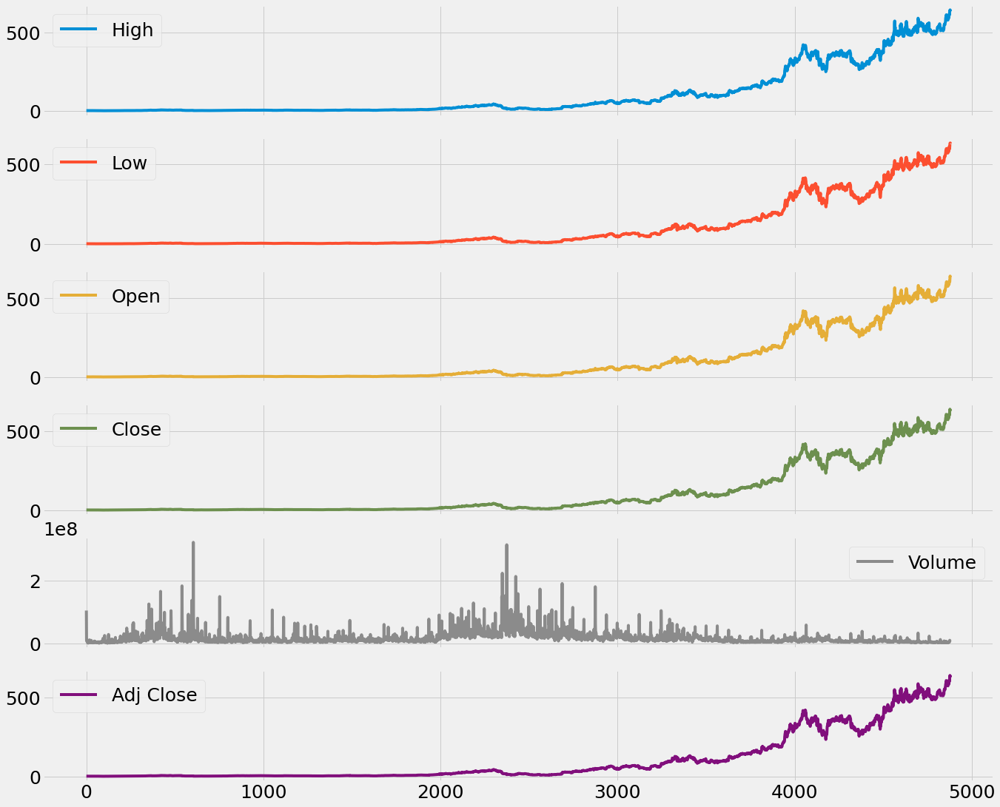

In [32]:
# Plot total

df.plot(subplots=True, figsize=(20.5, 18))
plt.show()

# Decomposição Sazonal das ações

**Decomposição sazonal**

Verificação de estacionariedade e decomposição sazonal

Se uma série temporal for estacionária, isso implica a falta de tendências gerais (mudanças na média e na variância ao longo do tempo) nos dados. Isso é importante como uma consideração na previsão de séries temporais.

In [39]:
# Reamostragem para frequência mensal 
df_t = df.resample('M').mean()
df_t.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2002-05-31,1.175119,1.121429,1.155833,1.135834,2.464677e+07,1.135834
2002-06-30,1.084322,1.011929,1.050214,1.038071,3.709510e+06,1.038071
2002-07-31,1.154675,1.066429,1.119578,1.110000,3.345936e+06,1.110000
2002-08-31,0.902175,0.832890,0.874805,0.870974,2.949227e+06,0.870974
2002-09-30,0.858679,0.812786,0.843179,0.828071,2.787470e+06,0.828071


In [35]:
dateparse = lambda dates:pd.datetime.strptime(dates,'%Y-%m-%d')

df = pd.read_csv('netflix.csv',parse_dates = ['Date'], index_col = 'Date', date_parser = dateparse)
df

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2002-05-23,1.242857,1.145714,1.156429,1.196429,104790000.0,1.196429
2002-05-24,1.225000,1.197143,1.214286,1.210000,11104800.0,1.210000
2002-05-28,1.232143,1.157143,1.213571,1.157143,6609400.0,1.157143
2002-05-29,1.164286,1.085714,1.164286,1.103571,6757800.0,1.103571
2002-05-30,1.107857,1.071429,1.107857,1.071429,10154200.0,1.071429
...,...,...,...,...,...,...
2021-10-05,640.390015,606.890015,606.940002,634.809998,9534300.0,634.809998
2021-10-06,639.869995,626.359985,628.179993,639.099976,4580400.0,639.099976
2021-10-07,646.840027,630.450012,642.229980,631.849976,3556900.0,631.849976


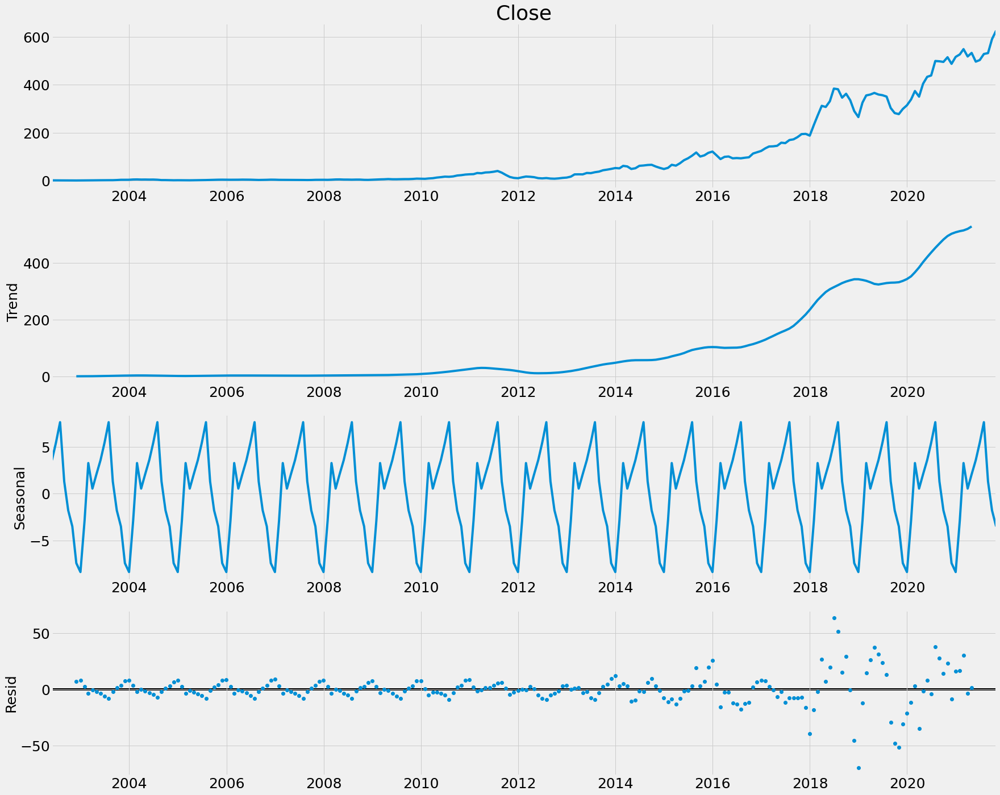

In [40]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

model_seasonal = seasonal_decompose(df_t.Close).plot()
plt.savefig('decomposição_sazonal.png')
plt.show()

In [132]:
base = df["Close"]
base

Date
2002-05-23      1.196429
2002-05-24      1.210000
2002-05-28      1.157143
2002-05-29      1.103571
2002-05-30      1.071429
                 ...    
2021-10-05    634.809998
2021-10-06    639.099976
2021-10-07    631.849976
2021-10-08    632.659973
2021-10-11    627.039978
Name: Close, Length: 4881, dtype: float64

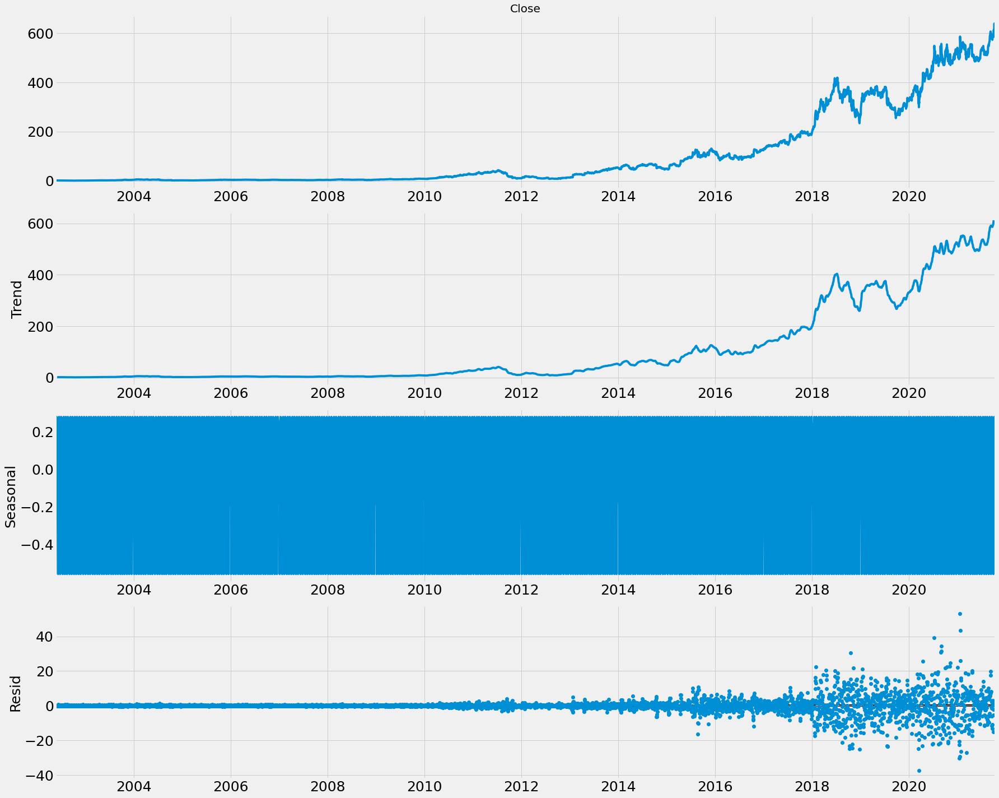

In [133]:
# Importação da biblioteca decomposição sazonal
from statsmodels.tsa.seasonal import seasonal_decompose

# Decomposição aditiva
sd = seasonal_decompose(base, freq = 12)
sd.plot()
plt.show()

<AxesSubplot:xlabel='Date'>

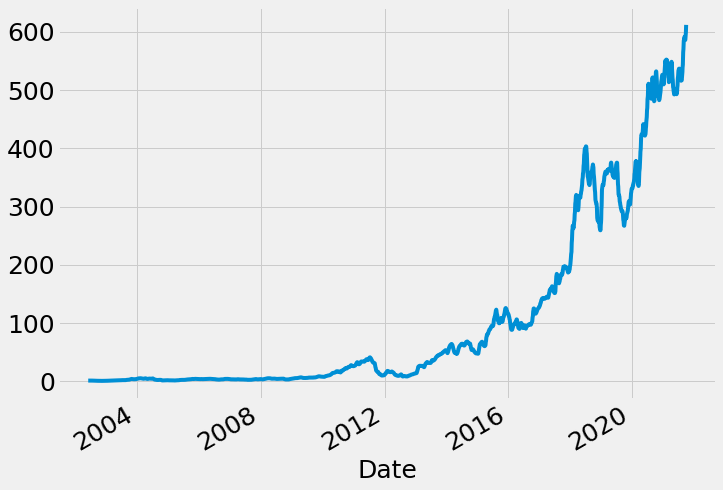

In [134]:
# Padrão de tendência extraído
dt = sd.trend

dt.plot(figsize=(10.5, 8))

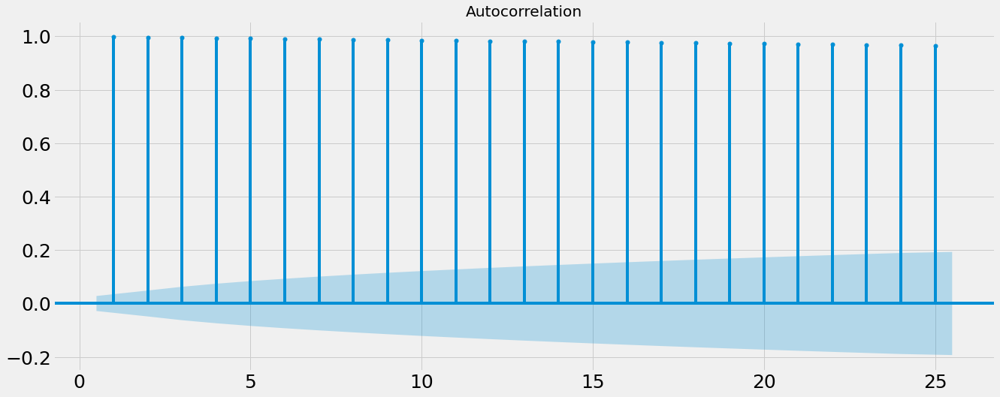

In [135]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, ax = plt.subplots(figsize=(20,8))
plot_acf(base, lags=25, zero=False, ax=ax)
plt.show()

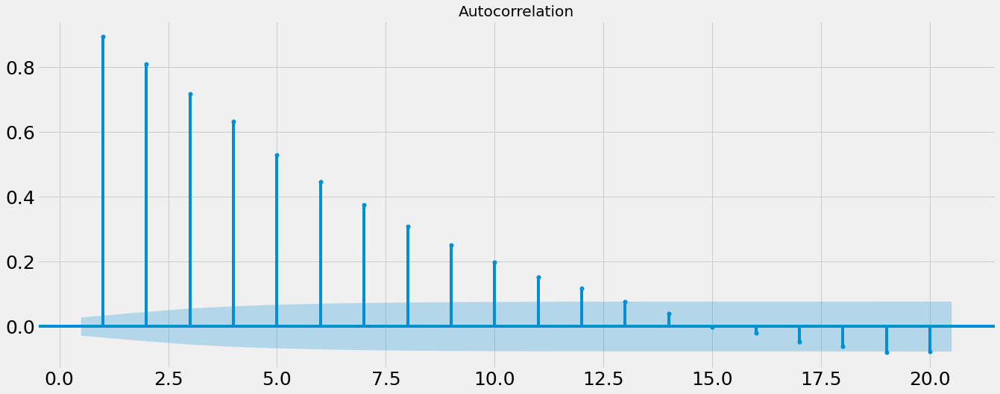

In [136]:
# Média movel
media_movel = base - base.rolling(20).mean()
media_movel = media_movel.dropna()

# Gráfico - Autocorrelation
fig, ax1 = plt.subplots(figsize=(20.5, 8))
plot_acf(media_movel, lags = 20, zero = False, ax = ax1)
plt.show()

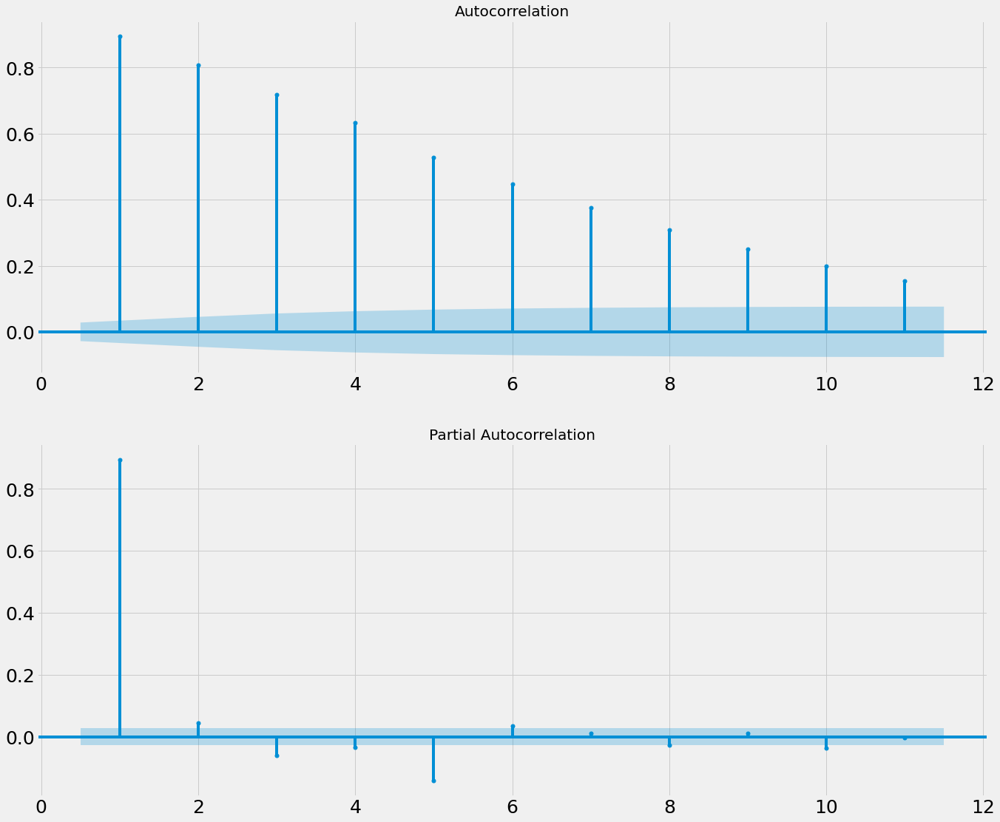

In [137]:
# SARIMA

# Gráfico 
fig, (ax1, ax2) = plt.subplots(2,1,figsize=(20.5, 18))
plot_acf(media_movel, lags=11, zero=False, ax=ax1)

# Gráfico PACF
plot_pacf(media_movel, lags=11, zero=False, ax=ax2)
plt.show()

In [138]:
# ACF corta no lag 1. então, temos que usar o modelo MA.

media_movel = media_movel.diff(1).diff(12).dropna()
media_movel

Date
2002-07-10    -0.030643
2002-07-11     0.086037
2002-07-12    -0.063037
2002-07-15    -0.102856
2002-07-16     0.011965
                ...    
2021-10-05    29.487045
2021-10-06    17.984961
2021-10-07    -5.685022
2021-10-08   -16.535010
2021-10-11    -7.833481
Name: Close, Length: 4849, dtype: float64

# Transformação Box-Cox

**Vamos usar a transformação Box-Cox para suprimir algumas das variações**

- A transformação Box-Cox é uma família de transformações de poder indexadas por um parâmetro lambda. Sempre que você usá-lo, o parâmetro precisa ser estimado a partir dos dados. Em séries temporais, o processo pode ter uma variância não constante. se a variação muda com o tempo, o processo não é estacionário. Freqüentemente, é desejável transformar uma série temporal para torná-la estacionária.

- Às vezes, após a aplicação de Box-Cox com um determinado valor de lambda, o processo pode parecer estacionário. Às vezes, é possível que mesmo se após a aplicação da transformação Box-Cox a série não parecer estacionária, os diagnósticos da modelagem ARIMA podem ser usados para decidir se a diferenciação ou sazonalidade pode ser útil para remover tendências polinomiais ou sazonais, respectivamente . Depois disso, o resultado pode ser um modelo ARMA que é estacionário.

# Diferenciação

- Ao construir modelos para prever dados de série temporal (como ARIMA), outra etapa de pré-processamento é diferenciar os dados (calculando sequencialmente xt − xt − 1) até chegarmos a um ponto onde a série é estacionária. Os modelos levam em consideração as oscilações, mas não as tendências e, portanto, a consideração das tendências por diferenciação nos permite usar os modelos que levam em consideração as oscilações.

- Uma vez que o modelo foi construído, podemos contabilizar as tendências separadamente, adicionando as tendências em termos de componentes.

# Diferenciação sazonal

- Um método de diferenciação de dados é a diferenciação sazonal, que envolve o cálculo da diferença entre uma observação e a observação correspondente no ano anterior.

- O valor p indica que a série ainda não está estacionária.

- Comandos que usei para data

**Comando do pandas**

- shift(): É para deslocar os valores de índices semelhantes a data e hora em um incremento de tempo especificado um determinado número de vezes.

**Comando do Scipy**
- boxcox: Retorna um conjunto de dados transformado por uma transformação de potência Box-Cox.

**Comando do statsmodels**

- adfuller: O teste Augmented Dickey-Fuller pode ser usado para testar uma raiz unitária em um processo univariado na presença de correlação serial

In [46]:
df_t['close_box'], lmbda = stats.boxcox(df_t.Close)
df_t['box_diff_seasonal_12'] = df_t.close_box - df_t.close_box.shift(12)
df_t['box_diff_seasonal_3'] = df_t.close_box - df_t.close_box.shift(3)
df_t['box_diff2'] = df_t.box_diff_seasonal_12 - df_t.box_diff_seasonal_12.shift(1)

print()
print("Teste Dickey-Fuller: p=%f" % adfuller(df_t.close_box)[1])
print("Teste Dickey-Fuller: p=%f" % adfuller(df_t.box_diff_seasonal_12[12:])[1])
print("Teste Dickey-Fuller: p=%f" % adfuller(df_t.box_diff_seasonal_3[3:])[1])


Teste Dickey-Fuller: p=0.737440
Teste Dickey-Fuller: p=0.000895
Teste Dickey-Fuller: p=0.000001


- O valor p indica que a série é estacionária, pois o valor p calculado é inferior ao nível de significância alfa = 0,05

In [47]:
df_t['box_diff2'] = df_t.box_diff_seasonal_12 - df_t.box_diff_seasonal_12.shift(1)
df_t

,High,Low,Open,Close,Volume,Adj Close,close_box,box_diff_seasonal_12,box_diff_seasonal_3,box_diff2
Date,,,,,,,,,,
2002-05-31,1.175119,1.121429,1.155833,1.135834,2.464677e+07,1.135834,0.127059,NaN,NaN,NaN
2002-06-30,1.084322,1.011929,1.050214,1.038071,3.709510e+06,1.038071,0.037338,NaN,NaN,NaN
2002-07-31,1.154675,1.066429,1.119578,1.110000,3.345936e+06,1.110000,0.104154,NaN,NaN,NaN
2002-08-31,0.902175,0.832890,0.874805,0.870974,2.949227e+06,0.870974,-0.138506,NaN,-0.265565,NaN
2002-09-30,0.858679,0.812786,0.843179,0.828071,2.787470e+06,0.828071,-0.189333,NaN,-0.226671,NaN
...,...,...,...,...,...,...,...,...,...,...
2021-06-30,508.116364,498.675455,503.470914,503.324091,3.570936e+06,503.324091,5.541476,0.108305,-0.022873,0.000094
2021-07-31,534.298567,522.618091,528.609045,528.653330,3.677095e+06,528.653330,5.580215,0.044945,-0.006656,-0.063361
2021-08-31,535.937267,526.222275,529.884541,532.346817,2.488286e+06,532.346817,5.585702,0.052508,0.054668,0.007563


In [49]:
print("Teste Dickey-Fuller: p=%f" % adfuller(df_t.box_diff2[13:])[1])

Teste Dickey-Fuller: p=0.000000


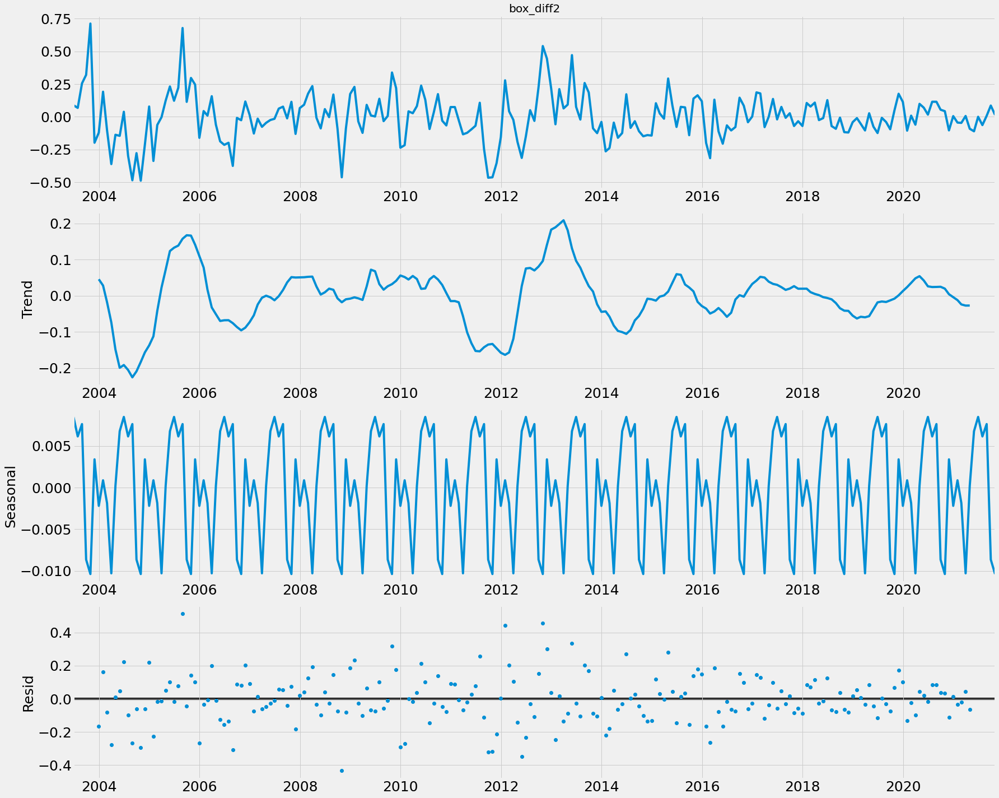

In [48]:
seasonal_decompose(df_t.box_diff2[13:]).plot()
plt.savefig('decomposição_sazonal_1.png')
plt.show()

# Autocorrelation


- A autocorrelação é a correlação de uma série temporal com a mesma série temporal defasada. Ele resume a força de um relacionamento com uma observação em uma série de tempo com observações em etapas de tempo anteriores.


- Criamos gráficos de fator de autocorrelação (ACF) e fator de autocorrelação parcial (PACF) para identificar padrões nos dados acima que são estacionários tanto na média quanto na variância. A ideia é identificar a presença de componentes AR e MA nos resíduos.

- Há uma correlação positiva com os primeiros 10 atrasos que talvez seja significativa para os primeiros 2-3 atrasos.


- Um bom ponto de partida para o parâmetro AR do modelo pode ser 3.

**Vamos experimentar a autocorrelação nas diferenças**


- Não há muitos picos nas parcelas fora da zona insignificante (sombreado), portanto, pode não haver informações suficientes disponíveis nos resíduos a serem extraídos pelos modelos AR e MA.


- Pode haver um componente sazonal disponível nos resíduos nas defasagens dos trimestres (3 meses) representado por picos nesses intervalos. Mas provavelmente não é significativo.

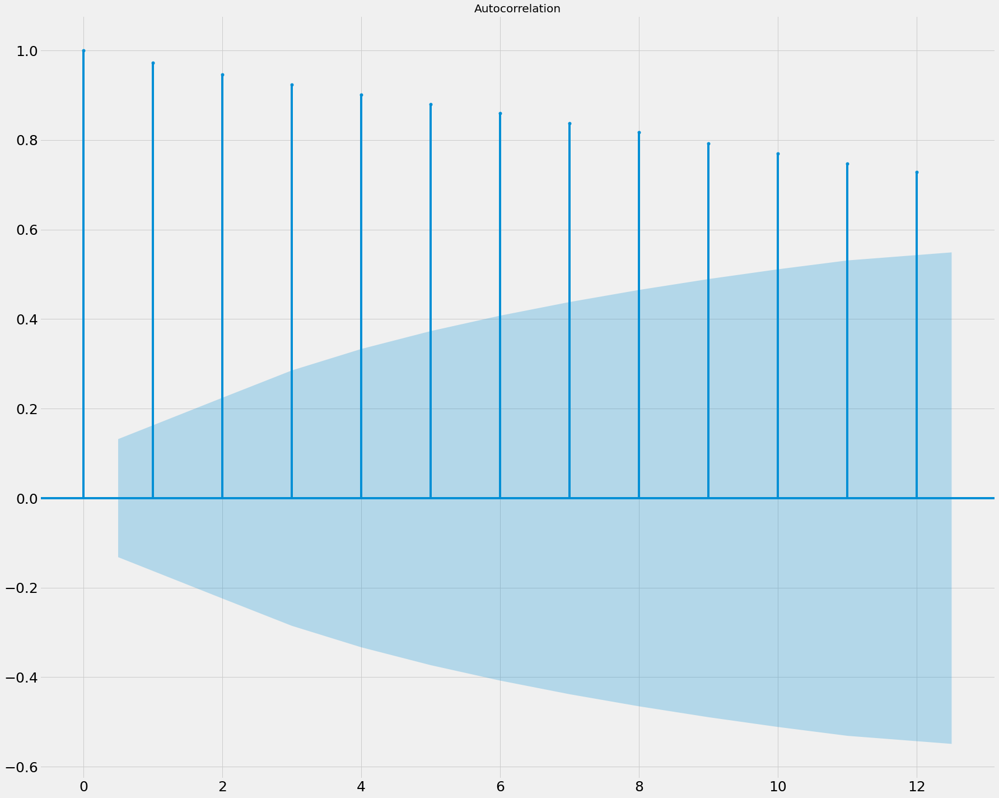

In [50]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(df_t.Close[13:].values.squeeze(), lags=12)

plt.tight_layout()
plt.show()

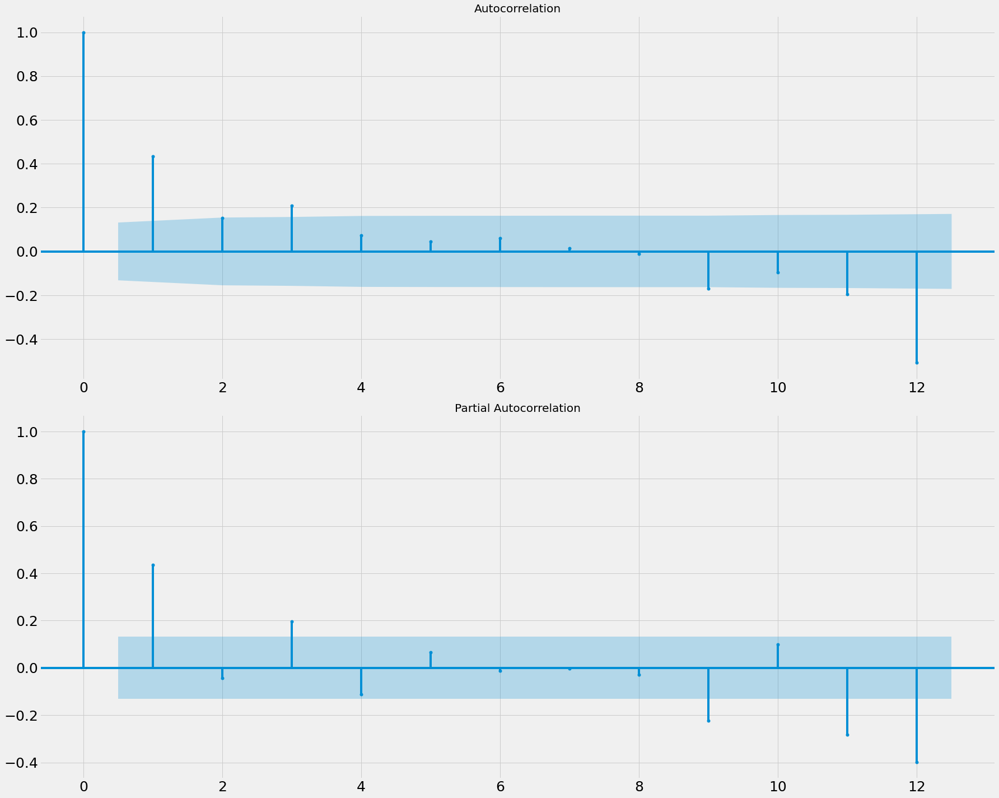

In [52]:
# Autocorrelação

# Gráfico autocorrelação
ax = plt.subplot(211)
plot_acf(df_t.box_diff2[13:].values.squeeze(), lags=12, ax=ax)

# Gráfico autocorrelação parcial
ax = plt.subplot(212)
plot_pacf(df_t.box_diff2[13:].values.squeeze(), lags=12, ax=ax)
plt.tight_layout()
plt.show()

# Modelo ARIMA

**Média Móvel AutoRegressiva Integrada**

- Um modelo de regressão linear é construído incluindo o número especificado e o tipo de termos, e os dados são preparados por um grau de diferenciação para torná-los estacionários, ou seja, para remover estruturas de tendência e sazonais que afetam negativamente o modelo de regressão. Um valor de 0 para um parâmetro indica não usar aquele elemento do modelo.


- Modelos ARIMA são denotados com a notação ARIMA (p, d, q). Esses parâmetros são responsáveis pela sazonalidade, tendência e ruído em conjuntos de dados.


**p - o número de observações de defasagem a serem incluídas no modelo, ou ordem de defasagem. (AR)**


**d - o número de vezes que as observações brutas são diferenciadas, ou o grau de diferenciação. (I)**


**q - o tamanho da janela da média móvel, também chamada de ordem da média móvel. (MA)**


- Um modelo de regressão linear é construído incluindo o número especificado e o tipo de termos, e os dados são preparados por um grau de diferenciação para torná-los estacionários, ou seja, para remover estruturas de tendência e sazonais que afetam negativamente o modelo de regressão. Um valor de 0 para um parâmetro indica não usar aquele elemento do modelo.


**Seleção de Parâmetro**


- Exploraremos iterativamente diferentes combinações de parâmetros. Para cada combinação, ajustamos um novo modelo ARIMA com SARIMAX () e avaliamos sua qualidade geral.


- Usaremos o valor AIC (Akaike Information Criterion), retornado com modelos ARIMA ajustados usando modelos de estatísticas. O AIC mede o quão bem um modelo se ajusta aos dados, levando em consideração a complexidade geral do modelo. Um modelo que se ajusta aos dados muito bem enquanto usa muitos recursos receberá uma pontuação AIC maior do que um modelo que usa menos recursos para obter a mesma qualidade de ajuste. Portanto, estamos interessados em encontrar o modelo que produza o menor valor de AIC.

In [53]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

qs = range(0, 3)
ps = range(0, 3)
d=1

parametros = product(ps, qs)
parametros_list = list(parametros)
len(parametros_list)

9

In [56]:
# Model Selection
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')

for param in parametros_list:
    try:
        modelo = SARIMAX(df_t.close_box, order=(param[0], d, param[1])).fit(disp=-1)
    except ValueError:
        print('Combinação de parâmetro ruim:', param)
        continue
        
    aic = modelo.aic
    if aic < best_aic:
        model_arima = modelo
        best_aic = aic
        best_param = param
    results.append([param, modelo.aic])
    
def invboxcox(y,lmbda):
    if lmbda == 0:
        return(np.exp(y))
    else:
        return(np.exp(np.log(lmbda*y+1)/lmbda))

Observe que algumas combinações de parâmetros podem levar a erros de especificação numérica e desabilitamos explicitamente as mensagens de aviso para evitar uma sobrecarga de mensagens de aviso. Essas especificações incorretas também podem levar a erros e lançar uma exceção, portanto, capturamos essas exceções e apenas imprimimos as combinações de parâmetros que causam esses problemas.

**Observe que os AICs são negativos, mas isso não é um problema.**

Normalmente, AIC é positivo; no entanto, ele pode ser alterado por qualquer constante aditiva e algumas alterações podem resultar em valores negativos de AIC. [...] Não é o tamanho absoluto do valor AIC, são os valores relativos ao longo do conjunto de modelos considerados, e particularmente as diferenças entre os valores AIC, que são importantes.

Ref: Seleção de Modelo e Inferência de Multi-modelo: Uma Abordagem Prática da Teoria da Informação (Burnham e Anderson, 2004)

In [55]:
resultados = pd.DataFrame(results)
resultados.columns = ["Parametros", "AIC"]
print(resultados.sort_values(by = 'AIC', ascending=True).head())

  Parametros         AIC
3     (1, 0) -345.600961
4     (1, 1) -343.610219
6     (2, 0) -343.606495
1     (0, 1) -343.556188
5     (1, 2) -342.755924


# Análise de Resultados

- A coluna de coeficiente mostra o peso (ou seja, importância) de cada recurso e como cada um impacta a série temporal. O P> | z | coluna nos informa sobre a importância de cada peso de recurso. Aqui, cada peso tem um valor p inferior ou próximo a 0,05, portanto, é razoável reter todos eles em nosso modelo.


- Ao ajustar modelos ARIMA sazonais (e quaisquer outros modelos para esse assunto), é importante executar o diagnóstico do modelo para garantir que nenhuma das suposições feitas pelo modelo foi violada. O objeto plot_diagnostics nos permite gerar diagnósticos de modelo rapidamente e investigar qualquer comportamento incomum.

In [57]:
print("Teste Dickey-Fuller:: p=%f" % adfuller(model_arima.resid[13:])[1])

Teste Dickey-Fuller:: p=0.000000


In [58]:
print(model_arima.summary())

                               SARIMAX Results                                
Dep. Variable:              close_box   No. Observations:                  234
Model:               SARIMAX(1, 1, 0)   Log Likelihood                 174.800
Date:                Sun, 20 Mar 2022   AIC                           -345.601
Time:                        18:23:36   BIC                           -338.699
Sample:                    05-31-2002   HQIC                          -342.818
                         - 10-31-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3602      0.048      7.526      0.000       0.266       0.454
sigma2         0.0130      0.001     13.466      0.000       0.011       0.015
Ljung-Box (L1) (Q):                   0.07   Jarque-

# Predição

- No histograma (canto superior direito), a linha do KDE deve seguir a linha N (0,1) (distribuição normal com média 0, desvio padrão 1) de perto. Isso é uma indicação se os resíduos são normalmente distribuídos ou não


- No Q-Q-plot, a distribuição ordenada de resíduos (pontos azuis) deve seguir a tendência linear das amostras retiradas de uma distribuição normal padrão com N (0, 1). Novamente, isso é uma indicação se os resíduos são normalmente distribuídos.


- O gráfico residual padronizado não exibe nenhuma sazonalidade óbvia. Isso é confirmado pelo gráfico de autocorrelação, que mostra que os resíduos da série temporal têm baixa correlação com as versões defasadas de si mesmos.

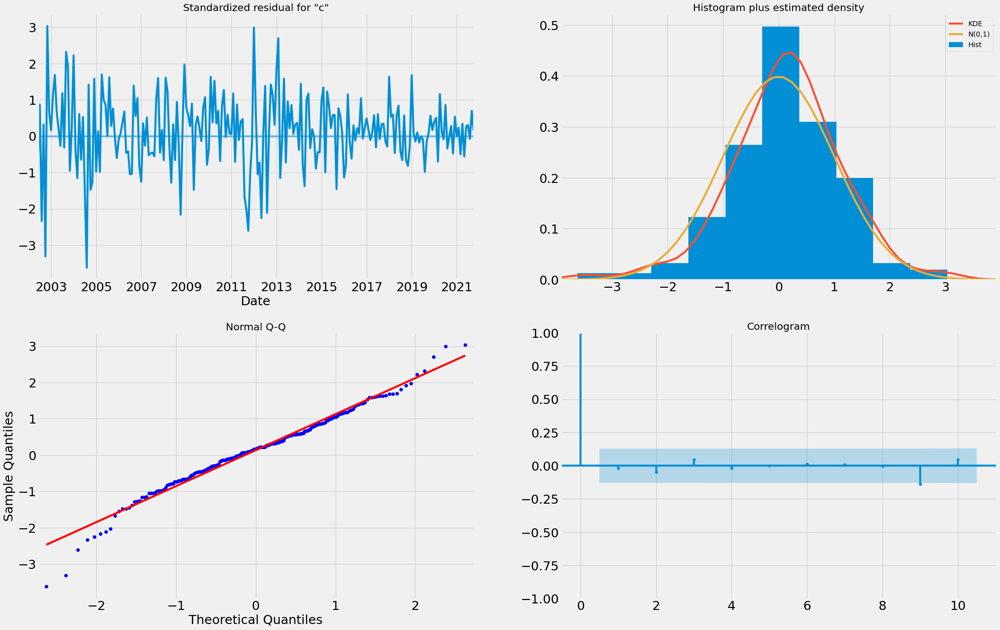

In [62]:
model_arima.plot_diagnostics(figsize=(30.5, 20))
plt.show()

In [71]:
df_t_pred = df_t[['Close']]
df_t_pred

,Close
Date,
2002-05-31,1.135834
2002-06-30,1.038071
2002-07-31,1.110000
2002-08-31,0.870974
2002-09-30,0.828071
...,...
2021-06-30,503.324091
2021-07-31,528.653330
2021-08-31,532.346817


In [77]:
date_list = [datetime(2002, 5, 31), datetime(2018, 4, 30), datetime(2018, 5, 31), datetime(2021, 10, 31)]
future = pd.DataFrame(index=date_list, columns= df_t.columns)
df_t_pred = pd.concat([df_t_pred, future])
df_t_pred['forecast'] = invboxcox(model_arima.predict(start=datetime(2021, 1, 31), end=datetime(2021, 11, 30)), lmbda)

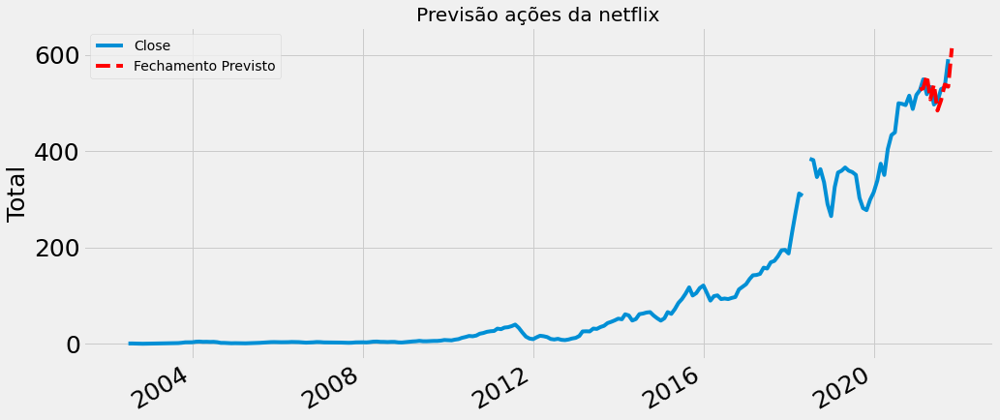

In [79]:
plt.figure(figsize=(15,7))
df_t_pred.Close.plot()
df_t_pred.forecast.plot(color='r', ls='--', label='Fechamento Previsto')
plt.legend()
plt.title('Previsão ações da netflix')
plt.ylabel('Total')
plt.savefig('Previsão_mensal_netflix_ARIMA.png')
plt.show()

# Modelo SARIMAX

Média móvel integrada AutoRegressiva sazonal com modelo de regressores.

Eu não esperava que os dados de bitcoin exibissem qualquer sazonalidade, mas aparentemente eles exibem uma leve sazonalidade. Então, vamos tentar melhorar o modelo usando o SARIMA.

Quando lidamos com efeitos sazonais, usamos o ARIMA sazonal, que é denotado como ARIMA (p, d, q) (P, D, Q) s. Aqui, (p, d, q) são os parâmetros não sazonais descritos acima, enquanto (P, D, Q) seguem a mesma definição, mas são aplicados ao componente sazonal da série temporal. O termo s é a periodicidade da série temporal (4 para períodos trimestrais, 12 para períodos anuais, etc.).

Eu experimentei este modelo com períodos anuais e trimestrais (alterne as linhas comentadas para ver a sazonalidade de 12 meses).

Seleção de Parâmetro

O mesmo processo de seleção de parâmetros para ARIMA sazonal. Para cada combinação, ajustamos um novo modelo ARIMA sazonal com SARIMAX () e avaliamos sua qualidade geral.

In [80]:
Qs = range(0, 2)
qs = range(0, 3)
Ps = range(0, 3)
ps = range(0, 3)

D=1
d=1

In [81]:
parametros = product(ps, qs, Ps, Qs)
parametros_list = list(parametros)
len(parametros_list)

results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')

In [82]:
for param in parametros_list:
    try:
        model_sarimax = SARIMAX(df_t.close_box, order=(param[0], d, param[1]), seasonal_order=(param[2], D, param[3], 4)).fit(disp=-1)
    except ValueError:
        print('bad parameter combination:', param)
        continue
    
    aic = model_sarimax.aic
    if aic < best_aic:
        best_model = model_sarimax
        best_aic = aic
        best_param = param
    
    results.append([param, model_sarimax.aic])

# Análise de Resultados

In [85]:
result_table = pd.DataFrame(results)
result_table.columns = ['Parametros', 'AIC']
result_table

,Parametros,AIC
0,"(0, 0, 0, 0)",-161.796257
1,"(0, 0, 0, 1)",-298.540613
2,"(0, 0, 1, 0)",-217.841426
3,"(0, 0, 1, 1)",-296.632000
4,"(0, 0, 2, 0)",-234.566520
5,"(0, 0, 2, 1)",-295.034655
6,"(0, 1, 0, 0)",-183.937219
7,"(0, 1, 0, 1)",-322.743745
8,"(0, 1, 1, 0)",-253.117613
9,"(0, 1, 1, 1)",-320.755648


In [87]:
print(result_table.sort_values(by = 'AIC', ascending=True).head())

      Parametros         AIC
19  (1, 0, 0, 1) -324.069800
7   (0, 1, 0, 1) -322.743745
25  (1, 1, 0, 1) -322.199221
37  (2, 0, 0, 1) -322.182178
21  (1, 0, 1, 1) -322.148515


In [88]:
print("Teste Dickey-Fuller:: p=%f" % adfuller(best_model.resid[13:])[1])

Teste Dickey-Fuller:: p=0.000012


In [89]:
print(model_sarimax.summary())

                                      SARIMAX Results                                      
Dep. Variable:                           close_box   No. Observations:                  234
Model:             SARIMAX(2, 1, 2)x(2, 1, [1], 4)   Log Likelihood                 165.479
Date:                             Sun, 20 Mar 2022   AIC                           -314.957
Time:                                     18:32:35   BIC                           -287.487
Sample:                                 05-31-2002   HQIC                          -303.875
                                      - 10-31-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0529      2.563      0.021      0.984      -4.971       5.077
ar.L2          0.2093      

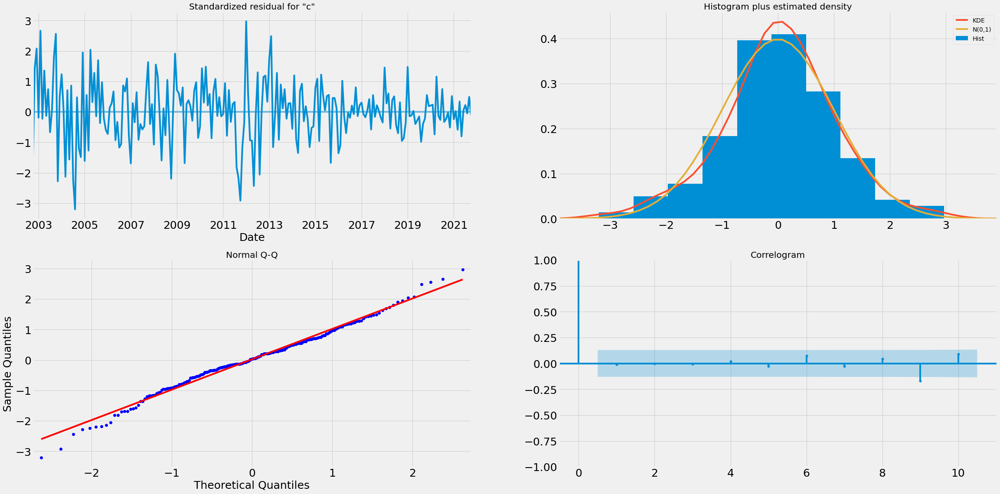

In [91]:
model_sarimax.plot_diagnostics(figsize=(35.5, 18))
plt.show()

Dickey–Fuller test:: p=0.000011


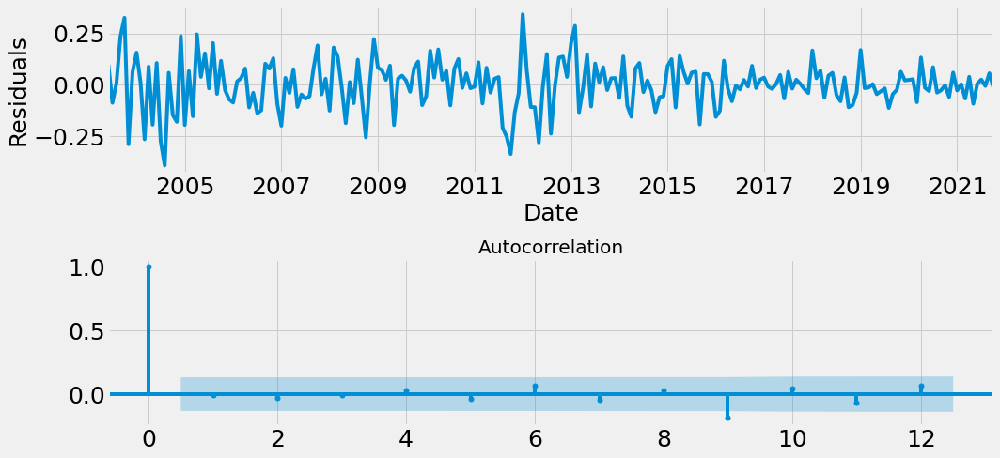

In [94]:
plt.figure(figsize=(15,7))
plt.subplot(211)
model_sarimax.resid[13:].plot()
plt.ylabel(u'Residuals')

ax = plt.subplot(212)
plot_acf(model_sarimax.resid[13:].values.squeeze(), lags=12, ax=ax)
print("Dickey–Fuller test:: p=%f" % adfuller(model_sarimax.resid[13:])[1])

plt.tight_layout()
plt.show()

In [95]:
btc_month2 = df_t[['Close']]
btc_month2

,Close
Date,
2002-05-31,1.135834
2002-06-30,1.038071
2002-07-31,1.110000
2002-08-31,0.870974
2002-09-30,0.828071
...,...
2021-06-30,503.324091
2021-07-31,528.653330
2021-08-31,532.346817


In [120]:
date_list = [datetime(2021, 12, 31), datetime(2020, 4, 30), datetime(2021, 5, 31), datetime(2021, 10, 30)]
future = pd.DataFrame(index=date_list, columns= df_t.columns)
btc_month2 = pd.concat([btc_month2, future])
btc_month2

,Close,High,Low,Open,Volume,Adj Close,close_box,box_diff_seasonal_12,box_diff_seasonal_3,box_diff2,forecast
2002-05-31,1.135834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
2002-06-30,1.038071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.135834
2002-07-31,1.110000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.038071
2002-08-31,0.870974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.110000
2002-09-30,0.828071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.927864
...,...,...,...,...,...,...,...,...,...,...,...
2021-10-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


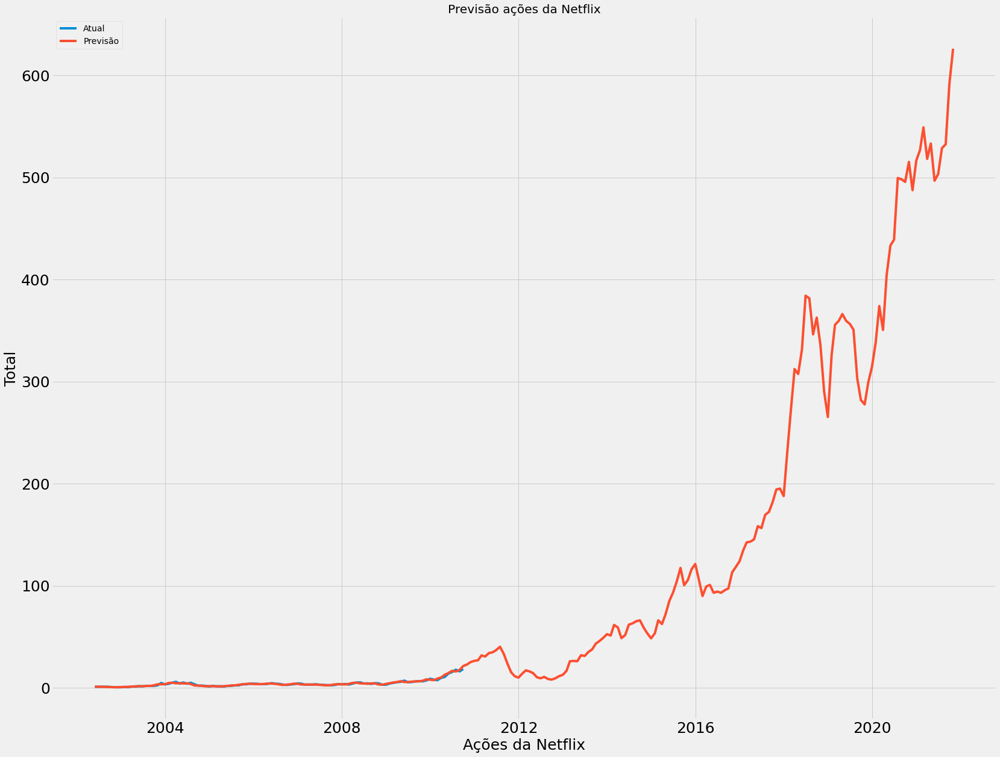

In [131]:
plt.plot(btc_month2["forecast"])
plt.plot(btc_month2["Close"])
plt.title("Previsão ações da Netflix")
plt.xlabel("Ações da Netflix")
plt.ylabel("Total")
plt.legend(["Atual", "Previsão"])
plt.savefig('ações_netflix.png')
plt.show()

# Outros modelos

**Modelo ARIMA - 1**

O ACF não sazonal não mostra nenhum dos padrões usuais dos modelos MA, AR ou ARMA, então não escolhemos nenhum deles. O Seaosnal ACF e PACF parecem um modelo MA(1). Selecionamos o modelo que combina ambos.

Modelo ARIMA 1

**Modelo menor AIC e um pouco diferente anterior a componente sazonal Deltra e 1 ao invés 2**

In [139]:
# Modelo ARIMA
from pmdarima.arima import auto_arima

modelo_arima_auto = auto_arima(base,
                               easonal = True, 
                               m = 50, d = 0, D = 1, max_p = 2, max_q = 2,
                               trace = True, error_action ='ignore',
                               suppress_warnings = True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[50] intercept   : AIC=inf, Time=351.43 sec
 ARIMA(0,0,0)(0,1,0)[50] intercept   : AIC=44850.571, Time=3.05 sec
 ARIMA(1,0,0)(1,1,0)[50] intercept   : AIC=30144.806, Time=151.38 sec
 ARIMA(0,0,1)(0,1,1)[50] intercept   : AIC=40168.026, Time=84.06 sec
 ARIMA(0,0,0)(0,1,0)[50]             : AIC=45107.521, Time=1.46 sec
 ARIMA(1,0,0)(0,1,0)[50] intercept   : AIC=31497.420, Time=17.84 sec



KeyboardInterrupt



In [140]:
# Modelo - Auto ARIMA
modelo_arima_auto

NameError: name 'modelo_arima_auto' is not defined

In [ ]:
# Modelo aic - Maior que anterior modelo
modelo_arima_auto.aic()

In [ ]:
# Súmario do modelo
print(modelo_arima_auto.summary())

# Previsão do modelo

In [ ]:
# Previsão do arima
modelo_arima_pred = modelo_arima_auto.predict(n_periods = 200)
modelo_arima_pred

In [ ]:
# Dataframe da previsão da ação

pred = pd.DataFrame(modelo_arima_pred, columns=["Previsão"])
pred

# Gráfico da previsão

In [ ]:
pd.concat([pred.Previsão],axis=1).plot(linewidth=1, figsize=(20,5))

plt.legend(["Previsão"])
plt.ylabel("Total")
plt.xlabel('Preços das ações Uber')
plt.title('Previsão',size=15)
plt.show();

# Modelo SARIMA

- SARIMA(2, 0, 2)x(2, 1, 0, 12) tem um desempenho melhor que outro modelo de ordens e tem baixo valor de AIC.
- Divida o conjunto de trem e o conjunto de teste do conjunto de dados de trem e ajuste nosso modelo.

**Modelo SARIMAX**

- Prob(Q) é >0,05, então não rejeitamos a hipótese nula de que os resíduos não são correlacionados. Prob(JB) >0,05, então não rejeitamos a hipótese nula de que os resíduos não são normalmente distribuídos Assim, com base no resumo dado, os Resíduos não são correlacionados e normalmente distribuídos

In [ ]:
# Modelo SARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Ajuste o modelo SARIMAX ao conjunto de treino
modelo_sarimax = SARIMAX(base, order = (2,0, 2), seasonal_order = (2, 1, 0, 12))

# Treinamento do modelo SARIMA
modelo_sarimax_fit = modelo_sarimax.fit()

In [ ]:
# Summary dos dados
print(modelo_sarimax_fit.summary())

In [ ]:
# 4 gráfico diagnóstico do modelo SARIMA

modelo_sarimax_fit.plot_diagnostics(figsize=(28.5, 25))
plt.show()

**Standardized residul**

- O gráfico de resíduos padronizado informa que não há padrões óbvios nos resíduos A curva KDE é muito semelhante à distribuição normal. A maioria dos Datapoints está na linha reta. Além disso, correlações de 95% para atraso maior que um não são significativas Nosso modelo segue um comportamento padronizado. se não, temos que melhorar nosso modelo Prever os valores para o conjunto de teste

In [ ]:
# Prever os valores para o conjunto de teste

x_1 = len(base)
y_2 = len(base) + len(base) - 1

# Previsão do modelo sarimax
pred = modelo_sarimax_fit.predict(start = x_1, end = y_2)
pred

In [ ]:
# Previsão 

pred = modelo_sarimax_fit.predict(n_periods = 150)
pred = pd.DataFrame(pred)
pred

In [ ]:
plt.plot(pred["predicted_mean"])
plt.title("Previsão modelo SARIMA - Ações UBER")
plt.xlabel("Ações previsão")
pred.plot(label='Previsão')

# Métricas para o modelo

- RMSE: Raiz do erro quadrático médio 
- MAE: Erro absoluto médio  
- MSE: Erro médio quadrático
- MAPE: Erro Percentual Absoluto Médio
- R2: O R-Quadrado, ou Coeficiente de Determinação, é uma métrica que visa expressar a quantidade da variança dos dados.

In [ ]:
from math import sqrt
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(base, pred))
mae = mean_absolute_error(base, pred)
mape = mean_absolute_percentage_error(base, pred)
mse = mean_squared_error(base, pred)
r2 = r2_score(base, pred)

pd.DataFrame([rmse, mae, mse, mape, r2], ['RMSE', 'MAE', 'MSE', "MAPE",'R²'], columns=['Resultado'])